In [10]:
import numpy as np
import xarray as xr
#from dask.diagnostics import ProgressBar
from xgcm import Grid
from matplotlib import pyplot as plt
import dask
import dask.array as dsa
#import cartopy.crs as ccrs
#import cartopy.feature as cfeature
#from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

%matplotlib inline

In [11]:
ls /g/data1a/fu5/nm5072/coastal_ROMS_budget_subsets

BMP_diag.nc        SYD_avg_04.nc  SYD_diag_01.nc  SYD_diag_07.nc
CH_diag.nc         SYD_avg_05.nc  SYD_diag_02.nc  SYD_diag_08.nc
ROMS_heat_budget/  SYD_avg_06.nc  SYD_diag_03.nc  SYD_diag_09.nc
SYD_avg_01.nc      SYD_avg_07.nc  SYD_diag_04.nc  SYD_diag.nc
SYD_avg_02.nc      SYD_avg_08.nc  SYD_diag_05.nc
SYD_avg_03.nc      SYD_avg_09.nc  SYD_diag_06.nc


In [12]:
# from dask.distributed import Client,LocalCluster
# client = Client(scheduler_file='../scheduler.json')
# print(client)

In [13]:
# datapath = '/scratch/fu5/cgk561/eac/20year_freerun_NEW/output_heatbudget/'
# diag_t = xr.open_mfdataset(datapath + 'outer_dia_09*.nc', chunks={'ocean_time': 1}, combine='nested'
#                            ,concat_dim="ocean_time", data_vars='minimal', drop_variables = ['dstart', 'ntimes','nRST'])
# ts = xr.open_mfdataset(datapath + 'outer_avg_09*.nc', chunks={'ocean_time': 1}, combine='nested'
#                            ,concat_dim="ocean_time", data_vars='minimal', drop_variables = ['dstart', 'ntimes','nRST'])

In [14]:
# print('Total Size: %6.2F GB' % (diag_t.nbytes / 1e9))

In [15]:
# print('Total Size: %6.2F GB' % (ts.nbytes / 1e9))

## Subset by time and space to make things a bit faster

In [16]:
# #Coffs box
# i = 209         # southward boundary
# ii = 217         # northward boundary
# j = 86         # westward boundary
# jj = 96         # eastward boundary
# ds = ts.isel(eta_psi=slice(i,ii-1), eta_rho=slice(i,ii), eta_u=slice(i,ii), eta_v=slice(i,ii-1),
#                xi_psi=slice(j,jj-1), xi_rho=slice(j,jj), xi_u=slice(j,jj-1), xi_v=slice(j,jj)).load()

# diag = diag_t.isel(eta_psi=slice(i,ii-1), eta_rho=slice(i,ii), eta_u=slice(i,ii), eta_v=slice(i,ii-1),
#                xi_psi=slice(j,jj-1), xi_rho=slice(j,jj), xi_u=slice(j,jj-1), xi_v=slice(j,jj)).load()

# print('Total Size: %6.2F GB' % (ds.nbytes / 1e9))
# print('Total Size: %6.2F GB' % (diag.nbytes / 1e9))

In [17]:
# diag.to_netcdf('CH_diag_09.nc')
# ds.to_netcdf('CH_avg_09.nc')

In [18]:
diag = xr.open_mfdataset('/local/fu5/nm5072/tmp/ROMS_heat_budget/CH_diag*.nc', chunks={'ocean_time': 1}, combine='nested'
                         ,concat_dim="ocean_time")
ds = xr.open_mfdataset('/local/fu5/nm5072/tmp/ROMS_heat_budget/CH_avg*.nc', chunks={'ocean_time': 1}, combine='nested'
                            ,concat_dim="ocean_time")

# Creating a grid object
While xgcm doesn't currently have an implementation for the SGRID convention for ROMS, a workaround consist on renaming eta_u and xi_v dimensions to rho. With this replacement 'psi' points have now a position (eta_v, xi_u). See issue here https://github.com/xgcm/xgcm/issues/108

Here I also test to see if the new XGCM 'metrics' functionality works.

In [19]:
# Including metrics
ds = ds.rename({'eta_u': 'eta_rho', 'xi_v': 'xi_rho', 'xi_psi': 'xi_u', 'eta_psi': 'eta_v'})

coords={'X':{'center':'xi_rho', 'inner':'xi_u'}, 
    'Y':{'center':'eta_rho', 'inner':'eta_v'}, 
    'Z':{'center':'s_rho', 'outer':'s_w'}}

grid = Grid(ds, coords=coords, periodic=[])

Zo_rho = (ds.hc * ds.s_rho + ds.Cs_r * ds.h) / (ds.hc + ds.h)
z_rho = Zo_rho * (ds.zeta + ds.h) + ds.zeta
Zo_w = (ds.hc * ds.s_w + ds.Cs_w * ds.h) / (ds.hc + ds.h)
z_w = Zo_w * (ds.zeta + ds.h) + ds.zeta

ds.coords['z_w'] = z_w.where(ds.mask_rho, 0).transpose('ocean_time', 's_w', 'eta_rho', 'xi_rho')
ds.coords['z_rho'] = z_rho.where(ds.mask_rho, 0).transpose('ocean_time', 's_rho', 'eta_rho', 'xi_rho')


ds['pm_v'] = grid.interp(ds.pm, 'Y')
ds['pn_u'] = grid.interp(ds.pn, 'X')
ds['pm_u'] = grid.interp(ds.pm, 'X')
ds['pn_v'] = grid.interp(ds.pn, 'Y')
ds['pm_psi'] = grid.interp(grid.interp(ds.pm, 'Y'),  'X') # at psi points (eta_v, xi_u) 
ds['pn_psi'] = grid.interp(grid.interp(ds.pn, 'X'),  'Y') # at psi points (eta_v, xi_u)

ds['dx'] = 1/ds.pm
ds['dx_u'] = 1/ds.pm_u
ds['dx_v'] = 1/ds.pm_v
ds['dx_psi'] = 1/ds.pm_psi

ds['dy'] = 1/ds.pn
ds['dy_u'] = 1/ds.pn_u
ds['dy_v'] = 1/ds.pn_v
ds['dy_psi'] = 1/ds.pn_psi

ds['dz'] = grid.diff(ds.z_w, 'Z', boundary='fill')
ds['dz_w'] = grid.diff(ds.z_rho, 'Z', boundary='fill')
ds['dz_u'] = grid.interp(ds.dz, 'X')
ds['dz_w_u'] = grid.interp(ds.dz_w, 'X')
ds['dz_v'] = grid.interp(ds.dz, 'Y')
ds['dz_w_v'] = grid.interp(ds.dz_w, 'Y')

ds['dA'] = ds.dx * ds.dy

metrics = {
    ('X',): ['dx', 'dx_u', 'dx_v', 'dx_psi'], # X distances
    ('Y',): ['dy', 'dy_u', 'dy_v', 'dy_psi'], # Y distances
    ('Z',): ['dz', 'dz_u', 'dz_v', 'dz_w', 'dz_w_u', 'dz_w_v'], # Z distances
    ('X', 'Y'): ['dA'] # Areas
}
grid = Grid(ds, coords=coords, metrics=metrics, periodic=[])

# Work our whether calculation of dz is right

In [20]:
ds

<xarray.Dataset>
Dimensions:      (Nuser: 25, boundary: 4, eta_rho: 8, eta_v: 7, ocean_time: 8309, s_rho: 30, s_w: 31, tracer: 2, xi_rho: 10, xi_u: 9)
Coordinates:
    lat_u        (eta_rho, xi_u) float64 dask.array<chunksize=(8, 9), meta=np.ndarray>
    lat_rho      (eta_rho, xi_rho) float64 dask.array<chunksize=(8, 10), meta=np.ndarray>
    lon_psi      (eta_v, xi_u) float64 dask.array<chunksize=(7, 9), meta=np.ndarray>
    lat_v        (eta_v, xi_rho) float64 dask.array<chunksize=(7, 10), meta=np.ndarray>
    lon_v        (eta_v, xi_rho) float64 dask.array<chunksize=(7, 10), meta=np.ndarray>
    lat_psi      (eta_v, xi_u) float64 dask.array<chunksize=(7, 9), meta=np.ndarray>
    lon_rho      (eta_rho, xi_rho) float64 dask.array<chunksize=(8, 10), meta=np.ndarray>
    lon_u        (eta_rho, xi_u) float64 dask.array<chunksize=(8, 9), meta=np.ndarray>
  * s_w          (s_w) float64 -1.0 -0.9433 -0.8883 ... -0.02161 -0.01 0.0
  * s_rho        (s_rho) float64 -0.9715 -0.9156 -0.8614 ... -0.0156 -0.004799
  * ocean_time   (ocean_time) datetime64[ns] 1994-01-01T12:00:00 ... 2016-09-...
    z_w          (ocean_time, s_w, eta_rho, xi_rho) float64 dask.array<chunksize=(1, 31, 8, 10), meta=np.ndarray>
    z_rho        (ocean_time, s_rho, eta_rho, xi_rho) float64 dask.array<chunksize=(1, 30, 8, 10), meta=np.ndarray>
Dimensions without coordinates: Nuser, boundary, eta_rho, eta_v, tracer, xi_rho, xi_u
Data variables:
    user         (ocean_time, Nuser) float64 dask.array<chunksize=(730, 25), meta=np.ndarray>
    Akv_bak      (ocean_time) float64 2e-05 2e-05 2e-05 ... 2e-05 2e-05 2e-05
    Znudg        (ocean_time) float64 0.1429 0.1429 0.1429 ... 0.1429 0.1429
    rho0         (ocean_time) float64 1.025e+03 1.025e+03 ... 1.025e+03
    nl_tnu2      (ocean_time, tracer) float64 dask.array<chunksize=(730, 2), meta=np.ndarray>
    M2obc_out    (ocean_time, boundary) float64 dask.array<chunksize=(730, 4), meta=np.ndarray>
    Vstretching  (ocean_time) int32 5 5 5 5 5 5 5 5 5 5 ... 5 5 5 5 5 5 5 5 5 5
    mask_u       (ocean_time, eta_rho, xi_u) float64 dask.array<chunksize=(730, 8, 9), meta=np.ndarray>
    ntsDIA       (ocean_time) int32 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1
    el           (ocean_time) float64 13.38 13.38 13.38 ... 13.38 13.38 13.38
    rdrg         (ocean_time) float64 0.0003 0.0003 0.0003 ... 0.0003 0.0003
    Akp_bak      (ocean_time) float64 5e-06 5e-06 5e-06 ... 5e-06 5e-06 5e-06
    Cs_r         (ocean_time, s_rho) float64 dask.array<chunksize=(730, 30), meta=np.ndarray>
    ntsAVG       (ocean_time) int32 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1
    FSobc_in     (ocean_time, boundary) float64 dask.array<chunksize=(730, 4), meta=np.ndarray>
    Akt_bak      (ocean_time, tracer) float64 dask.array<chunksize=(730, 2), meta=np.ndarray>
    nAVG         (ocean_time) int32 288 288 288 288 288 ... 288 288 288 288 288
    gamma2       (ocean_time) float64 1.0 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
    Tobc_out     (ocean_time, boundary, tracer) float64 dask.array<chunksize=(730, 4, 2), meta=np.ndarray>
    xl           (ocean_time) float64 10.93 10.93 10.93 ... 10.93 10.93 10.93
    nDIA         (ocean_time) int32 288 288 288 288 288 ... 288 288 288 288 288
    ndefHIS      (ocean_time) int32 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    h            (ocean_time, eta_rho, xi_rho) float64 dask.array<chunksize=(730, 8, 10), meta=np.ndarray>
    nl_visc2     (ocean_time) float64 55.0 55.0 55.0 55.0 ... 55.0 55.0 55.0
    M3obc_in     (ocean_time, boundary) float64 dask.array<chunksize=(730, 4), meta=np.ndarray>
    M3nudg       (ocean_time) float64 0.1429 0.1429 0.1429 ... 0.1429 0.1429
    dt           (ocean_time) float64 300.0 300.0 300.0 ... 300.0 300.0 300.0
    Zob          (ocean_time) float64 0.02 0.02 0.02 0.02 ... 0.02 0.02 0.02
    ndefAVG      (ocean_time) int32 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    Falpha       (ocean_time) float64 2.0 2.0 2.0 2.0 2.0 ... 2.0 2.0 2.0 2.0
    theta_b      (ocean_

In [21]:
ds.dz

,Array,Chunk
Bytes,159.53 MB,19.20 kB
Shape,"(8309, 30, 8, 10)","(1, 30, 8, 10)"
Count,158125 Tasks,8309 Chunks
Type,float64,numpy.ndarray


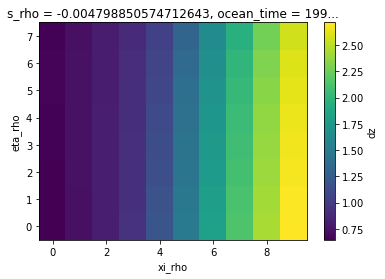

In [22]:
ds.dz[0,-1,:,:].plot()

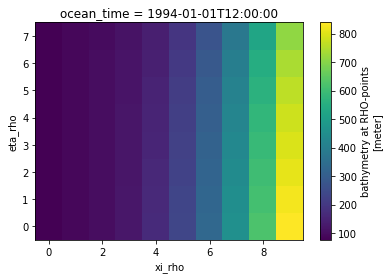

In [23]:
ds.h[0,:,:].plot()

In [24]:
#Set constants, and sanity check that xgcm is calculating areas and volumes right.
Cp = 4181.3
Rho_0 = 1025 
# Calculate volume the romstools way
Volume = ds.h/(ds.pm*ds.pn)        
V0 = Volume.sum(['eta_rho', 'xi_rho'])           
# Calculate volume the xgcm way
V_A = (ds.dA*ds.h).sum(['eta_rho', 'xi_rho'])
# Check that they match
print(V_A.values,V0.values)

[2.83571483e+11 2.83571483e+11 2.83571483e+11 ... 2.83571483e+11
 2.83571483e+11 2.83571483e+11] [2.83571483e+11 2.83571483e+11 2.83571483e+11 ... 2.83571483e+11
 2.83571483e+11 2.83571483e+11]


## Flux Divergence
First we define a function to calculate the convergence of the advective and diffusive fluxes, since this has to be repeated for both tracers.

In [25]:
def tracer_flux_budget():
    """Calculate the convergence of fluxes of tracer. Return a new xarray.Dataset."""
    conv_horiz_adv_flux = diag.temp_hadv.rename('conv_horiz_adv_flux_TH')
    conv_horiz_diff_flux = diag.temp_hdiff.rename('conv_horiz_diff_flux_TH')
    # sign convention is opposite for vertical fluxes
    conv_vert_adv_flux = diag['temp_vadv'].rename('conv_vert_adv_flux_TH')
    conv_vert_diff_flux = diag['temp_vdiff'].rename('conv_vert_diff_flux_TH')

    all_fluxes = [conv_horiz_adv_flux, conv_horiz_diff_flux, conv_vert_adv_flux, conv_vert_diff_flux]
    conv_all_fluxes = sum(all_fluxes).rename('conv_total_flux_TH')
    
    return xr.merge(all_fluxes + [conv_all_fluxes])

In [26]:
budget_th = tracer_flux_budget()

# Add it all up
The total tendency should be given by

In [27]:
budget_th['total_tendency_TH'] = (budget_th.conv_total_flux_TH) # + (budget_th.surface_flux_conv_TH.fillna(0.))
budget_th

<xarray.Dataset>
Dimensions:                  (eta_rho: 8, ocean_time: 8309, s_rho: 30, xi_rho: 10)
Coordinates:
    lat_rho                  (eta_rho, xi_rho) float64 dask.array<chunksize=(8, 10), meta=np.ndarray>
    lon_rho                  (eta_rho, xi_rho) float64 dask.array<chunksize=(8, 10), meta=np.ndarray>
  * s_rho                    (s_rho) float64 -0.9715 -0.9156 ... -0.004799
  * ocean_time               (ocean_time) datetime64[ns] 1994-01-01T12:00:00 ...
Dimensions without coordinates: eta_rho, xi_rho
Data variables:
    conv_horiz_adv_flux_TH   (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 30, 8, 10), meta=np.ndarray>
    conv_horiz_diff_flux_TH  (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 30, 8, 10), meta=np.ndarray>
    conv_vert_adv_flux_TH    (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 30, 8, 10), meta=np.ndarray>
    conv_vert_diff_flux_TH   (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 30, 8, 10), meta=np.ndarray>
    conv_total_flux_TH       (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 30, 8, 10), meta=np.ndarray>
    total_tendency_TH        (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 30, 8, 10), meta=np.ndarray>

## Include the “truth”

In [28]:
budget_th['total_tendency_TH_truth'] = diag.temp_rate 

In [29]:
# plt.figure(figsize=(12,6))
# (budget_th.total_tendency_TH.sum(dim=['s_rho', 'eta_rho', 'xi_rho'])).plot(linewidth=2, label = 'total 3D ADV and diff fluxes')
# (budget_th.total_tendency_TH_truth.sum(dim=['s_rho', 'eta_rho', 'xi_rho'])).plot(linestyle='--', linewidth=2, label='true temperature tendency')
# plt.legend()
# plt.ylabel('temperature rate of change [degC/day]')

In [30]:
# # Just the surface layer
# plt.figure(figsize=(12,6))
# (budget_th.total_tendency_TH[:,0,:,:].sum(dim=['eta_rho', 'xi_rho'])).plot(linewidth=2, label = 'total 3D ADV and diff fluxes')
# (budget_th.total_tendency_TH_truth[:,0,:,:].sum(dim=['eta_rho', 'xi_rho'])).plot(linestyle='--', linewidth=2, label='true temperature tendency')
# plt.legend()
# plt.ylabel('temperature rate of change [degC/day]')

# Validate Budget¶
Now we do some checks to verify that the budget adds up.

## Vertical and Horizontal Integrals of Budget
We will take an average over the first 10 timesteps

In [31]:
time_slice = dict(ocean_time=slice(0, 10))

In [32]:
def check_horizontal(budget, suffix):
    ds_chk = (budget[[f'total_tendency_{suffix}', f'total_tendency_{suffix}_truth']]
              .sum(dim=['s_rho', 'xi_rho']).mean(dim='ocean_time'))
    return ds_chk

def check_vertical(budget, suffix):
    ds_chk = (budget[[f'total_tendency_{suffix}', f'total_tendency_{suffix}_truth']]
              .sum(dim=['eta_rho', 'xi_rho']).mean(dim='ocean_time'))
    return ds_chk

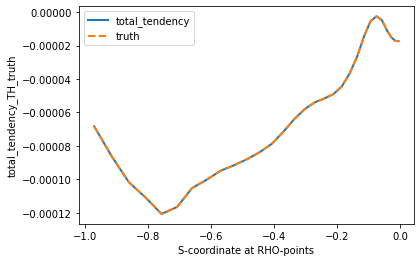

In [33]:
th_vert = check_vertical(budget_th.isel(**time_slice), 'TH').load()
th_vert.total_tendency_TH.plot(linewidth=2, label = 'total_tendency')
th_vert.total_tendency_TH_truth.plot(linestyle='--', linewidth=2, label='truth')
plt.legend()


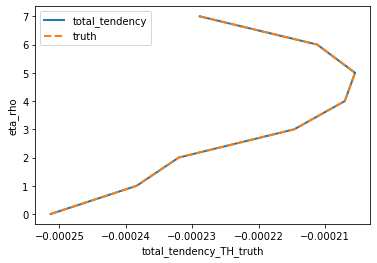

In [34]:
th_horiz = check_horizontal(budget_th.isel(**time_slice), 'TH').load()
th_horiz.total_tendency_TH.plot(linewidth=2, y='eta_rho',label='total_tendency')
th_horiz.total_tendency_TH_truth.plot(linestyle='--', linewidth=2, y='eta_rho',label='truth')
plt.legend()

## Sum up terms in surface layer over length of the timeseries and plot as bar chart

In [35]:
#budget_th_tot = (budget_th.isel(s_rho=0).sum(dim=['eta_rho','xi_rho','ocean_time'])).load()

In [36]:
# ADV = budget_th_tot.conv_horiz_adv_flux_TH + budget_th_tot.conv_vert_adv_flux_TH
# import pandas as pd
# df = pd.DataFrame({'COFFS':['TTEND', 'ADV', 'SURF', 'DIFF'], 'contribution':[budget_th_tot.total_tendency_TH_truth.values
#                                                              ,ADV.values
#                                                              ,budget_th_tot.conv_vert_diff_flux_TH.values
#                                                              ,budget_th_tot.conv_horiz_diff_flux_TH.values]})
# df.contribution=df.contribution.astype(float)
# ax = df.plot.bar(x='COFFS', y='contribution', rot=0)
# plt.savefig('CH_heat_terms_bar_plot.png', dpi=300,bbox_inches='tight')

In [37]:
#Surface layer only
#budget_th_box = (budget_th.isel(s_rho=29).sum(dim=['eta_rho','xi_rho'])).load()
#Depth Average
budget_th_box = ((grid.integrate(budget_th,['Z','Y','X'])*86400)/V0).load()
budget_th_box

<xarray.Dataset>
Dimensions:                  (ocean_time: 8309)
Coordinates:
  * ocean_time               (ocean_time) datetime64[ns] 1994-01-01T12:00:00 ...
Data variables:
    conv_horiz_adv_flux_TH   (ocean_time) float64 0.1258 -0.06696 ... 0.07432
    conv_horiz_diff_flux_TH  (ocean_time) float64 0.002376 ... -0.01084
    conv_vert_adv_flux_TH    (ocean_time) float64 -3.056e-09 ... 1.916e-09
    conv_vert_diff_flux_TH   (ocean_time) float64 0.00666 0.004177 ... -0.01242
    conv_total_flux_TH       (ocean_time) float64 0.1348 -0.06319 ... 0.05106
    total_tendency_TH        (ocean_time) float64 0.1348 -0.06319 ... 0.05106
    total_tendency_TH_truth  (ocean_time) float64 0.1348 -0.06319 ... 0.05106

In [38]:
#budget_th_box.to_netcdf('CH_budget_th_box.nc')
#budget_th_box.to_netcdf('CH_budget_th_box_Zbar.nc')

Text(0, 0.5, 'temperature rate of change [degC/s]')

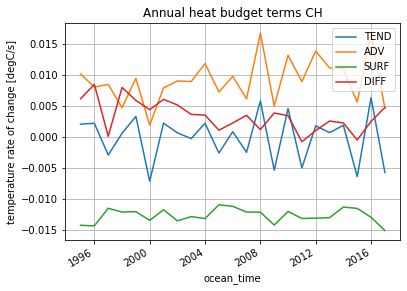

In [39]:
# Plot temperature tendency
budget_th_box.total_tendency_TH_truth.resample(ocean_time='1Y').mean().plot(label='TEND')
(budget_th_box.conv_horiz_adv_flux_TH + budget_th_box.conv_vert_adv_flux_TH).resample(ocean_time='1Y').mean().plot(label='ADV')
budget_th_box.conv_vert_diff_flux_TH.resample(ocean_time='1Y').mean().plot(label='SURF')
budget_th_box.conv_horiz_diff_flux_TH.resample(ocean_time='1Y').mean().plot(label='DIFF')
plt.legend()
plt.grid()
plt.title('Annual heat budget terms CH')
plt.ylabel('temperature rate of change [degC/s]')
#plt.savefig('CH_heat_terms_annual_mean.png', dpi=300,bbox_inches='tight')

In [40]:
ADV = budget_th_box.conv_horiz_adv_flux_TH + budget_th_box.conv_vert_adv_flux_TH
import pandas as pd
df = pd.DataFrame({'CH':['TTEND', 'ADV', 'SURF', 'DIFF'], 'contribution':[budget_th_box.total_tendency_TH_truth
                                                             ,ADV
                                                             ,budget_th_box.conv_vert_diff_flux_TH
                                                             ,budget_th_box.conv_horiz_diff_flux_TH]})
df

,CH,contribution
0,TTEND,[<xarray.DataArray 'total_tendency_TH_truth' (...
1,ADV,[<xarray.DataArray ()>\narray(0.12581393)\nCoo...
2,SURF,[<xarray.DataArray 'conv_vert_diff_flux_TH' ()...
3,DIFF,[<xarray.DataArray 'conv_horiz_diff_flux_TH' (...


<AxesSubplot:xlabel='CH', ylabel='contribution'>

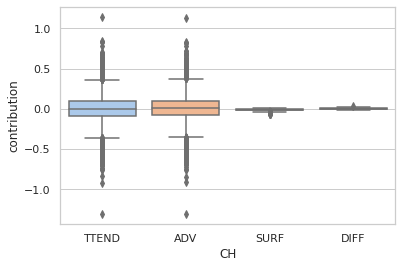

In [41]:
import seaborn as sns
sns.set(style="whitegrid", palette="pastel", color_codes=True)
foo = df.explode('contribution')
foo['contribution'] = foo['contribution'].astype('float')
sns.boxplot(data=foo, x='CH', y='contribution')

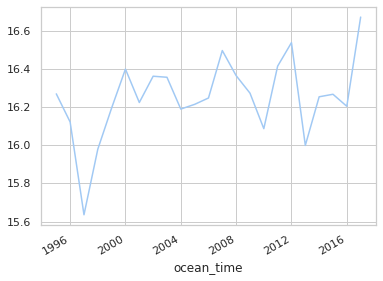

In [42]:
(grid.integrate(ds.temp,['X','Y','Z'])/V0).resample(ocean_time='1Y').mean().plot()

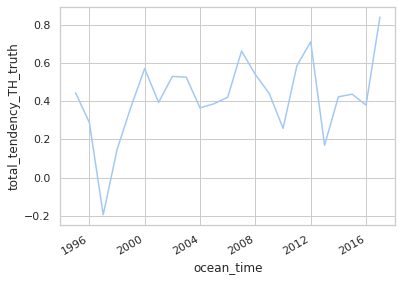

In [43]:
budget_th_box.total_tendency_TH_truth.cumsum().resample(ocean_time='1Y').mean().plot()